# Clustering of clasroom sessions using a pair of words matrix

## Steps:
- Filtering words that are going to be used to build a matrix
- Build a matrix per session, where each row and column represents a word, and each cell represents the frequency of that pair of words appear in a sentence
- Use clustering algorithms to find 2 groups of clasroom sessions
- Measure the distance vector between the cluster's centroids
- Calculate the projection of each session into the distance vector
- Plot the projection of each session

### Defining preprocessing constants 

In [1]:
FILTER_STOP_WORDS = False
FILTER_BY_LENGTH = False
MIN_LENGTH = 30.0 #min
NORMALIZE_MATRIX_BY_LENGTH = False

## 0. Import, paths y definitions

C:\Users\CATALINA ESPINOZA\AppData\Local\conda\conda\envs\env27\lib\site-packages\pydub\utils.py:165: RuntimeWarning: Couldn't find ffmpeg or avconv - defaulting to ffmpeg, but may not work
  warn("Couldn't find ffmpeg or avconv - defaulting to ffmpeg, but may not work", RuntimeWarning)



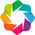

In [2]:
from __future__ import division
import string
import math
import os
import pandas as pd 
import numpy as np
import seaborn as sns
import nltk
%matplotlib inline
import matplotlib
import matplotlib.pylab as pylab
import matplotlib.pyplot as plt
import json
import unidecode
import pickle
from scipy import stats
from text_clustering import text_preprocessing as tp, word_connection_matrix as wcm
import holoviews as hv
hv.extension('bokeh')

In [3]:
root_path = 'C:\Users\CATALINA ESPINOZA\Documents\clusters ciae'
data_path = os.path.join(root_path,'data')
output_path = os.path.join(root_path,'output')
by_grade_path = os.path.join(output_path,'textos_ulloa_by_curso')
by_grade_and_content = os.path.join(data_path,'textos_ulloa_by_grade_content')
by_content_path = os.path.join(output_path,'textos_ulloa_by_contenido')
all_files_path = os.path.join(data_path,'textos_ulloa')
all_classes = os.path.join(data_path,'clases_ulloa.txt')

In [4]:
all_documents_dict = tp.read_documents(all_files_path)

In [5]:
with open(os.path.join(output_path,'pickles','document_length_dict.pickle'),'rb') as f:
    document_length = pickle.load(f)

In [6]:
if FILTER_BY_LENGTH:
    filtered_documents = {}
    for document in all_documents_dict.keys():
        if document_length[document]>= MIN_LENGTH:
            filtered_documents[document] = all_documents_dict[document]
    all_documents_dict = filtered_documents

In [7]:
token_set = tp.get_all_token_set(all_documents_dict)
print(len(token_set))

14496


In [8]:
frequency_per_word = tp.get_frequency_per_word(all_documents_dict,token_set)

In [9]:
zipped = zip(token_set,frequency_per_word)
zipped.sort(key = lambda t: t[1], reverse=True)

In [10]:
# TODO: ver que hace tokenize porque no entiendo como cambia tanto el resultado de las palabras 
# mas frecuentes
print("N, Palabra, Frecuencia ")
for i in range(len(zipped)):
    print(str(i)+", "+str(zipped[i][0])+", "+str(zipped[i][1]))

N, Palabra, Frecuencia 
0, la, 12468
1, que, 12220
2, de, 11634
3, el, 7571
4, a, 6365
5, es, 5515
6, y, 4923
7, lo, 4789
8, se, 4717
9, no, 4227
10, en, 3809
11, por, 3785
12, un, 3108
13, porque, 2659
14, una, 2574
15, va, 2481
16, si, 2436
17, o, 2258
18, los, 2247
19, con, 2074
20, qué, 1979
21, está, 1878
22, ya, 1765
23, del, 1728
24, pero, 1589
25, eso, 1589
26, fuerza, 1564
27, para, 1551
28, más, 1531
29, cuando, 1501
30, como, 1446
31, entonces, 1375
32, yo, 1374
33, las, 1284
34, le, 1172
35, al, 1157
36, puede, 1035
37, tiene, 1010
38, te, 1001
39, hacer, 967
40, usted, 961
41, luz, 929
42, cómo, 918
43, ejemplo, 904
44, me, 896
45, su, 880
46, sí, 868
47, hay, 854
48, ser, 826
49, son, 793
50, ver, 775
51, tengo, 758
52, forma, 737
53, hace, 710
54, ahora, 705
55, dos, 683
56, esto, 669
57, mayor, 664
58, sea, 644
59, solamente, 644
60, campo, 634
61, velocidad, 619
62, todo, 610
63, estoy, 606
64, voy, 588
65, hacia, 580
66, decir, 554
67, otro, 552
68, también, 544
69, c

1926, 19, 12
1927, tuve, 12
1928, incide, 12
1929, hubiera, 12
1930, consume, 12
1931, signos, 12
1932, pez, 12
1933, invertidas, 12
1934, conveniente, 12
1935, puente, 12
1936, mil, 12
1937, lacerado, 12
1938, hubo, 12
1939, resolver, 12
1940, llevaste, 12
1941, pido, 12
1942, darle, 12
1943, chistes, 12
1944, n, 12
1945, toque, 12
1946, quedado, 12
1947, propia, 12
1948, trópico, 12
1949, quedaba, 12
1950, audífono, 12
1951, toca, 12
1952, detener, 12
1953, refracta, 12
1954, Ártico, 12
1955, torricelli, 12
1956, oportunidad, 12
1957, dibujado, 12
1958, evitar, 12
1959, defecto, 12
1960, quema, 12
1961, frecuencias, 12
1962, dile, 12
1963, lanza, 12
1964, ampolletas, 12
1965, detenerse, 12
1966, inversión, 12
1967, proyecto, 12
1968, llegado, 12
1969, geográfico, 12
1970, genética, 11
1971, yuliana, 11
1972, honda, 11
1973, comprar, 11
1974, oficio, 11
1975, proporcionales, 11
1976, colón, 11
1977, brasil, 11
1978, observé, 11
1979, sal, 11
1980, japón, 11
1981, multiplicación, 11
19

3426, capacitores, 5
3427, marcar, 5
3428, interno, 5
3429, asueto, 5
3430, olivares, 5
3431, in, 5
3432, construye, 5
3433, unión, 5
3434, pusieron, 5
3435, carta, 5
3436, colectivo, 5
3437, suba, 5
3438, básicas, 5
3439, bolivia, 5
3440, pulidas, 5
3441, escuche, 5
3442, inclinada, 5
3443, investigando, 5
3444, raya, 5
3445, interacción, 5
3446, estero, 5
3447, sumerge, 5
3448, rock, 5
3449, chavo, 5
3450, comunicación, 5
3451, ocupa, 5
3452, dientes, 5
3453, proviene, 5
3454, modificándose, 5
3455, matías, 5
3456, clasificar, 5
3457, bachata, 5
3458, podrías, 5
3459, taquicardia, 5
3460, llorar, 5
3461, celoso, 5
3462, sensible, 5
3463, jóvenes, 5
3464, correctamente, 5
3465, evidenciar, 5
3466, alturas, 5
3467, bloque, 5
3468, trabajan, 5
3469, pidió, 5
3470, comenzó, 5
3471, diablo, 5
3472, oral, 5
3473, técnicamente, 5
3474, zero, 5
3475, verdadera, 5
3476, chinos, 5
3477, hidráulicas, 5
3478, debería, 5
3479, mapa, 5
3480, rotar, 5
3481, piscina, 5
3482, bendiga, 5
3483, exceptu

4925, cargarse, 3
4926, pepe, 3
4927, túnica, 3
4928, cineticos, 3
4929, igualmente, 3
4930, permitidos, 3
4931, lavadora, 3
4932, copiando, 3
4933, viven, 3
4934, mol, 3
4935, fricción, 3
4936, invernaderos, 3
4937, consultar, 3
4938, sudando, 3
4939, ocupando, 3
4940, varilla, 3
4941, manuel, 3
4942, entienda, 3
4943, fila, 3
4944, opuestas, 3
4945, percibimos, 3
4946, perpendiculares, 3
4947, claramente, 3
4948, mecánicas, 3
4949, seguimos, 3
4950, deformaciones, 3
4951, geométricamente, 3
4952, graba, 3
4953, 90s, 3
4954, aprecia, 3
4955, rotacional, 3
4956, tiraron, 3
4957, aria, 3
4958, ampliar, 3
4959, torre, 3
4960, representación, 3
4961, celda, 3
4962, parlante, 3
4963, karaoke, 3
4964, consumos, 3
4965, dictar, 3
4966, des, 3
4967, sacas, 3
4968, compara, 3
4969, vibra, 3
4970, acto, 3
4971, dragon, 3
4972, 29, 3
4973, acuario, 3
4974, colgando, 3
4975, adecuada, 3
4976, minúscula, 3
4977, descomponen, 3
4978, salí, 3
4979, elegante, 3
4980, destruido, 3
4981, sólida, 3
4982

6425, alargada, 2
6426, diez, 2
6427, equivalentes, 2
6428, pulsación, 2
6429, tallas, 2
6430, bombea, 2
6431, volvimos, 2
6432, transmitiéndose, 2
6433, peña, 2
6434, antigüedad, 2
6435, bo2, 2
6436, cimiento, 2
6437, gazebo, 2
6438, permita, 2
6439, pregunte, 2
6440, dorados, 2
6441, esperes, 2
6442, mx, 2
6443, lectores, 2
6444, manipulación, 2
6445, bolas, 2
6446, utilizando, 2
6447, malas, 2
6448, galleta, 2
6449, repaso, 2
6450, introducción, 2
6451, bajen, 2
6452, factoría, 2
6453, steve, 2
6454, aquel, 2
6455, maestra, 2
6456, tuyos, 2
6457, mac, 2
6458, critica, 2
6459, johnson, 2
6460, compañeras, 2
6461, deportiva, 2
6462, tala, 2
6463, dividida, 2
6464, pensado, 2
6465, azules, 2
6466, roca, 2
6467, inercial, 2
6468, monster, 2
6469, esencia, 2
6470, yeso, 2
6471, altamar, 2
6472, calabaza, 2
6473, carro, 2
6474, glaciares, 2
6475, little, 2
6476, generacional, 2
6477, 1d, 2
6478, espa, 2
6479, interés, 2
6480, proporción, 2
6481, cuadrática, 2
6482, fijado, 2
6483, manejó,

7924, divertirse, 1
7925, atencio, 1
7926, estrecho, 1
7927, percibido, 1
7928, fábrega, 1
7929, one, 1
7930, voto, 1
7931, capaci, 1
7932, leído, 1
7933, tachones, 1
7934, repasando, 1
7935, solucione, 1
7936, renovado, 1
7937, parecidas, 1
7938, compruebes, 1
7939, procediendo, 1
7940, quédate, 1
7941, alivio, 1
7942, renovar, 1
7943, l4l, 1
7944, 9000000, 1
7945, auriculares, 1
7946, dudes, 1
7947, láminas, 1
7948, comediante, 1
7949, especifique, 1
7950, inventor, 1
7951, necesiten, 1
7952, herbarios, 1
7953, serón, 1
7954, orzuelos, 1
7955, estancias, 1
7956, describimos, 1
7957, barsa, 1
7958, trabajaban, 1
7959, prepara, 1
7960, necesites, 1
7961, alquiló, 1
7962, auroras, 1
7963, amplificando, 1
7964, sas, 1
7965, saw, 1
7966, bautizar, 1
7967, contextualizar, 1
7968, captado, 1
7969, perforada, 1
7970, llamaremos, 1
7971, eficaces, 1
7972, logotipo, 1
7973, coincide, 1
7974, quisieron, 1
7975, merece, 1
7976, dañarse, 1
7977, usuario, 1
7978, diluyente, 1
7979, estratosfera, 1

9424, yaoi, 1
9425, 09100, 1
9426, zipaquira, 1
9427, múltiplos, 1
9428, odiseo, 1
9429, hans, 1
9430, artístico, 1
9431, niu, 1
9432, kilovoltios, 1
9433, byte, 1
9434, 1600, 1
9435, quedará, 1
9436, quedaré, 1
9437, hilaturas, 1
9438, granjear, 1
9439, cap2, 1
9440, purgadores, 1
9441, medianamente, 1
9442, dándose, 1
9443, cerviz, 1
9444, genérico, 1
9445, ascendiendo, 1
9446, gaturro, 1
9447, mangú, 1
9448, quitando, 1
9449, an, 1
9450, averiado, 1
9451, pollería, 1
9452, capu, 1
9453, alargado, 1
9454, capo, 1
9455, semifusa, 1
9456, coliseo, 1
9457, dr, 1
9458, aran, 1
9459, jornada, 1
9460, tripulantes, 1
9461, consumía, 1
9462, muevas, 1
9463, 531, 1
9464, ayuno, 1
9465, ayuna, 1
9466, elongación, 1
9467, desfasadas, 1
9468, recordé, 1
9469, picado, 1
9470, 12,5, 1
9471, bora, 1
9472, cede, 1
9473, elevando, 1
9474, sumadas, 1
9475, oigan, 1
9476, acercándome, 1
9477, instantáneos, 1
9478, cerri, 1
9479, baleros, 1
9480, ayudaré, 1
9481, seguiría, 1
9482, pla, 1
9483, ayudará, 

10923, vialidad, 1
10924, cian, 1
10925, completó, 1
10926, agarra, 1
10927, satirizar, 1
10928, adelantos, 1
10929, subvaloración, 1
10930, compacta, 1
10931, cedió, 1
10932, sangra, 1
10933, tecnológico, 1
10934, waldo, 1
10935, velas, 1
10936, figuraba, 1
10937, cultivo, 1
10938, prefabricada, 1
10939, mayonesa, 1
10940, frigal, 1
10941, llegadas, 1
10942, mencionaban, 1
10943, girarla, 1
10944, vladimir, 1
10945, pío, 1
10946, yaca, 1
10947, videncia, 1
10948, primeridad, 1
10949, muebles, 1
10950, ópticos, 1
10951, cansona, 1
10952, calenté, 1
10953, avellaneda, 1
10954, sacarla, 1
10955, men, 1
10956, facía, 1
10957, biconcavo, 1
10958, desordenadas, 1
10959, octavos, 1
10960, inicie, 1
10961, masha, 1
10962, cidade, 1
10963, recojan, 1
10964, jodamos, 1
10965, dolencia, 1
10966, evitarlo, 1
10967, chapero, 1
10968, quitaba, 1
10969, dislexia, 1
10970, wikipedia, 1
10971, cuestionario, 1
10972, señalar, 1
10973, moral, 1
10974, servicial, 1
10975, expuestos, 1
10976, samsara, 1
1

12423, consideramos, 1
12424, shizuru, 1
12425, sevilla, 1
12426, tortilla, 1
12427, repartirla, 1
12428, rótula, 1
12429, propuesto, 1
12430, propuesta, 1
12431, holocausto, 1
12432, comieron, 1
12433, perlini, 1
12434, 323, 1
12435, colapsar, 1
12436, percusión, 1
12437, desmiente, 1
12438, frontera, 1
12439, procura, 1
12440, tapia, 1
12441, diamantada, 1
12442, alumbra, 1
12443, sedal, 1
12444, sally, 1
12445, alumbre, 1
12446, inflarojo, 1
12447, ingestiva, 1
12448, modificamos, 1
12449, sostenido, 1
12450, lamentaciones, 1
12451, elevador, 1
12452, íntima, 1
12453, disyuntiva, 1
12454, fijos, 1
12455, chicharrón, 1
12456, depilación, 1
12457, diábolos, 1
12458, súbito, 1
12459, karys, 1
12460, aplastar, 1
12461, elfo, 1
12462, publique, 1
12463, pecosos, 1
12464, aéreo, 1
12465, mica, 1
12466, controla, 1
12467, aérea, 1
12468, dibujador, 1
12469, espina, 1
12470, lancé, 1
12471, beat, 1
12472, inmenso, 1
12473, monturas, 1
12474, recuperando, 1
12475, municipal, 1
12476, enanos,

13922, auxiliar, 1
13923, tiradores, 1
13924, l'olivera, 1
13925, interiormente, 1
13926, conil, 1
13927, plants, 1
13928, intercepta, 1
13929, desprecie, 1
13930, miramar, 1
13931, finitas, 1
13932, continué, 1
13933, regirse, 1
13934, cipalmente, 1
13935, 2100, 1
13936, avanzados, 1
13937, aproximada, 1
13938, demos, 1
13939, pastorutti, 1
13940, choles, 1
13941, aldeas, 1
13942, lociones, 1
13943, fabrizio, 1
13944, ignacia, 1
13945, aprensiva, 1
13946, desean, 1
13947, gilardo, 1
13948, definidas, 1
13949, enviale, 1
13950, resaltando, 1
13951, dmv, 1
13952, descargarla, 1
13953, sumak, 1
13954, entregadas, 1
13955, gremios, 1
13956, tortuga, 1
13957, astoria, 1
13958, b.c, 1
13959, opinas, 1
13960, cubierta, 1
13961, resolverlo, 1
13962, 52.7, 1
13963, cubierto, 1
13964, inactiva, 1
13965, depositar, 1
13966, debryanshow, 1
13967, guaracha, 1
13968, canten, 1
13969, forenses, 1
13970, tamez, 1
13971, fundó, 1
13972, elevó, 1
13973, tupida, 1
13974, tramos, 1
13975, electrocutar, 1

## 1. Filtering words

In [11]:
# get the most frequent words from the documents
set_300_most_frequent = tp.get_filter_by_number(token_set,frequency_per_word,300,FILTER_STOP_WORDS)
#set_less_frequent = tp.get_inverse_filter_by_number(token_set,frequency_per_word,300)
#filtered_documents_dict = tp.filter_by_set(all_documents_dict,set_less_frequent) #NO USAR

## 2. Build pair of words matrices per session

In [12]:
#matrices_list,names_matrices = wcm.get_matrices(filtered_documents_dict,set_300_most_frequent)
matrices_list,names_matrices = wcm.get_matrices(all_documents_dict,set_300_most_frequent)
print(len(matrices_list))

56


Here is an example of one session represented as a pair of word matrix

<i>Note: Each cell represents the frequency of the relation of two words ($w_i \rightarrow w_j$). The diagonal measures the frequency of the word $w_i$</i>

In [13]:
matrix_example = pd.DataFrame(matrices_list[0])
matrix_example.columns = set_300_most_frequent
matrix_example.index = set_300_most_frequent
matrix_example

,la,que,de,el,a,es,y,lo,se,no,...,gracias,viendo,5,hacen,toda,existe,bajo,pasó,bueno,depender
la,335.0,75.0,104.0,34.0,26.0,37.0,43.0,22.0,33.0,18.0,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0
que,68.0,313.0,55.0,53.0,29.0,38.0,33.0,21.0,46.0,15.0,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
de,103.0,73.0,366.0,31.0,29.0,31.0,44.0,32.0,24.0,20.0,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,3.0
el,43.0,53.0,58.0,234.0,19.0,18.0,24.0,16.0,23.0,20.0,...,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0
a,46.0,36.0,42.0,23.0,167.0,11.0,17.0,15.0,8.0,7.0,...,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,5.0
es,52.0,46.0,45.0,51.0,10.0,159.0,15.0,16.0,16.0,14.0,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
y,33.0,30.0,29.0,24.0,19.0,16.0,154.0,20.0,19.0,10.0,...,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0
lo,27.0,90.0,33.0,27.0,25.0,29.0,14.0,131.0,18.0,4.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
se,28.0,29.0,30.0,30.0,24.0,13.0,9.0,13.0,129.0,6.0,...,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
no,22.0,26.0,23.0,17.0,21.0,14.0,12.0,22.0,23.0,97.0,...,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0


Then, we check if we have to normalize the matrix

In [14]:
if NORMALIZE_MATRIX_BY_LENGTH:
    norm_matrices_list = wcm.normalize_matrices(matrices_list,document_length)
else:
    norm_matrices_list = matrices_list

Finally, we flatten the matrices into arrays

In [15]:
norm_array_list = map(lambda x: np.ravel(x),norm_matrices_list)

## 3. Clustering matrices

(array([31.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0., 25.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <a list of 10 Patch objects>)

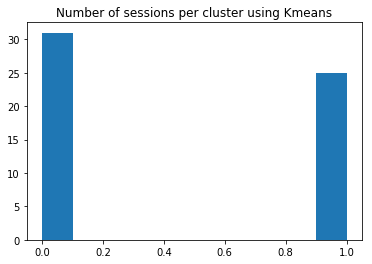

In [16]:
centers_kmeans,labels_kmeans = wcm.get_kmeans_clusters(norm_array_list,2)
plt.title("Number of sessions per cluster using Kmeans")
plt.hist(labels_kmeans)

In [17]:
labels_kmeans_all_words = map(lambda x: 1 if x>0 else 0,labels_kmeans)

(array([40.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0., 16.]),
 array([-1. , -0.8, -0.6, -0.4, -0.2,  0. ,  0.2,  0.4,  0.6,  0.8,  1. ]),
 <a list of 10 Patch objects>)

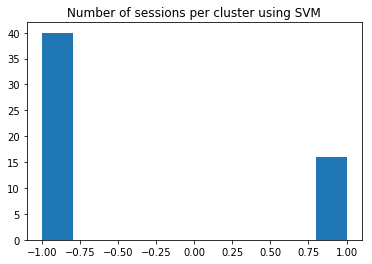

In [18]:
centers_svm,labels_svm = wcm.get_svm_clusters(norm_array_list)
plt.title("Number of sessions per cluster using SVM")
plt.hist(labels_svm)

## 4. Measure the distance between the clusters centroids

In [19]:
kmeans_axis = centers_kmeans[1] - centers_kmeans[0]
svm_axis = centers_svm[1] - centers_svm[0]

## 5. Matrices projection

In [20]:
kmeans_indicator_matrices = map(lambda x: np.dot(x,kmeans_axis),norm_array_list) 
svm_indicator_matrices = map(lambda x: np.dot(x,svm_axis),norm_array_list)

## 6. Plot matrices by kmeans indicator

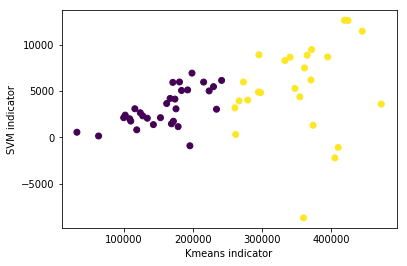

In [21]:
plt.ylabel('SVM indicator')
plt.xlabel('Kmeans indicator')
plt.scatter(kmeans_indicator_matrices,svm_indicator_matrices,c=labels_kmeans)
plt.show()

Plotting session length vs kmeans indicator

47.1073214286


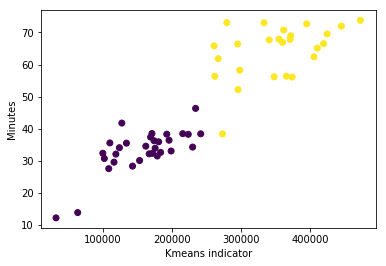

In [22]:
documents_length_audio = []
for i in range(len(kmeans_indicator_matrices)):
    name = names_matrices[i]
    documents_length_audio.append(document_length[name])
plt.ylabel('Minutes')
plt.xlabel('Kmeans indicator')
plt.scatter(kmeans_indicator_matrices,documents_length_audio,c=labels_kmeans)
print sum(documents_length_audio)/len(documents_length_audio)

Plotting session length by number of words per session, colored by clusterization

In [24]:
documents_n_words = []
for i in range(len(kmeans_indicator_matrices)):
    name = names_matrices[i]
    documents_n_words.append(len(all_documents_dict[name].split()))

288510


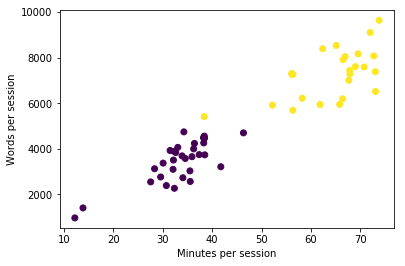

In [26]:
plt.xlabel('Minutes per session')
plt.ylabel('Words per session')
plt.scatter(documents_length_audio,documents_n_words,c=labels_kmeans)
print sum(documents_n_words)

Here we show the most frequent pair of words by lesson

Cluster 0

In [27]:
reload(wcm)

<module 'text_clustering.word_connection_matrix' from 'text_clustering\word_connection_matrix.pyc'>

In [28]:
documents_pair_frequency = wcm.get_most_frequent_pairs(norm_array_list,10,len(set_300_most_frequent))
for c in range(len(labels_kmeans)):
    if labels_kmeans[c] == 0:
        elements = documents_pair_frequency[c]
        print "Document "+str(c)
        print "-------------------"
        for j in range(len(elements)):
            print str(set_300_most_frequent[elements[j][0]])+ " -> " + str(set_300_most_frequent[elements[j][1]])
        print "-------------------"

Document 1
-------------------
el -> de
que -> se
que -> la
de -> la
es -> que
la -> que
que -> de
la -> de
de -> que
lo -> que
-------------------
Document 2
-------------------
la -> distancia
que -> lo
y -> el
que -> el
que -> la
que -> de
la -> velocidad
el -> de
la -> que
lo -> que
-------------------
Document 5
-------------------
que -> es
a -> que
es -> que
el -> de
la -> de
la -> que
que -> la
de -> la
de -> que
lo -> que
-------------------
Document 7
-------------------
es -> la
que -> es
que -> de
es -> que
la -> que
la -> de
que -> la
de -> la
de -> que
lo -> que
-------------------
Document 11
-------------------
el -> que
la -> que
es -> que
lo -> que
el -> de
de -> que
la -> imagen
que -> la
la -> de
de -> la
-------------------
Document 16
-------------------
el -> de
que -> se
es -> que
la -> que
que -> de
que -> la
de -> que
la -> de
de -> la
lo -> que
-------------------
Document 18
-------------------
el -> de
de -> luz
la -> que
que -> de
de -> que
lo -> que
que -

Cluster 1

In [29]:
documents_pair_frequency = wcm.get_most_frequent_pairs(norm_array_list,10,len(set_300_most_frequent))
for c in range(len(labels_kmeans)):
    if labels_kmeans[c] == 1:
        elements = documents_pair_frequency[c]
        print "Document "+str(c)
        print "-------------------"
        for j in range(len(elements)):
            print str(set_300_most_frequent[elements[j][0]])+ " -> " + str(set_300_most_frequent[elements[j][1]])
        print "-------------------"

Document 0
-------------------
el -> que
que -> el
que -> de
el -> de
que -> la
de -> que
la -> que
lo -> que
de -> la
la -> de
-------------------
Document 3
-------------------
que -> de
de -> que
el -> de
a -> la
va -> a
la -> que
la -> de
que -> la
lo -> que
de -> la
-------------------
Document 4
-------------------
la -> que
el -> de
el -> que
que -> el
va -> a
que -> la
lo -> que
el -> sonido
de -> la
la -> de
-------------------
Document 6
-------------------
que -> de
el -> de
va -> a
la -> que
de -> que
que -> la
lo -> que
la -> luz
la -> de
de -> la
-------------------
Document 8
-------------------
es -> que
que -> de
es -> la
de -> que
la -> que
que -> la
lo -> que
la -> luz
la -> de
de -> la
-------------------
Document 9
-------------------
el -> que
que -> se
que -> de
de -> la
la -> de
que -> la
de -> que
es -> que
la -> que
lo -> que
-------------------
Document 10
-------------------
que -> de
que -> se
de -> que
la -> que
la -> de
lo -> que
es -> que
la -> luz
que -

## 7. Get cumulative distribution by pair of words by cluster

#### 7.1 Split matrices by cluster

In [30]:
matrices_cluster1 = []
matrices_cluster0 = []
for i in range(len(labels_kmeans)):
    if labels_kmeans[i]:
        matrices_cluster1.append(norm_array_list[i])
    else:
        matrices_cluster0.append(norm_array_list[i])        

#### 7.2 Transform the list of matrices into a list with list of pair of words frequency

In [31]:
w_ij_cluster1 = np.transpose(matrices_cluster1)
w_ij_cluster0 = np.transpose(matrices_cluster0)

For example:

$la \rightarrow fuerza$ ($w_{0,26}$)

índice 0*300+27 = 27 

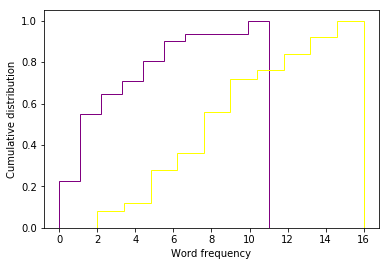

In [32]:
# plot the cumulative histogram
n, bins, patches = plt.hist(w_ij_cluster0[27], normed=1, histtype='step',
                           cumulative=True, label='Empirical',color='purple')
n, bins, patches = plt.hist(w_ij_cluster1[27], normed=1, histtype='step',
                           cumulative=True, label='Empirical',color='yellow')
plt.xlabel("Word frequency")
plt.ylabel("Cumulative distribution")
plt.show()

#### 7.3 Measure KS between the pair of words cumulative curves

In [33]:
ks_ij_clusters_1_0 = []
p_val_ks_ij_clusters_1_0 = []
for i in range(len(w_ij_cluster0)):
    ks = stats.ks_2samp(w_ij_cluster0[i],w_ij_cluster1[i])
    ks_ij_clusters_1_0.append(ks[0])
    p_val_ks_ij_clusters_1_0.append(ks[1])

For example, here is the KS of the combination of words $la \rightarrow fuerza$

In [34]:
ks_ij_clusters_1_0[27]

0.6232258064516129

Here is the sample of pair of words in which the p_value of the ks was significative

Text(0,0.5,u'Number of pairs of words')

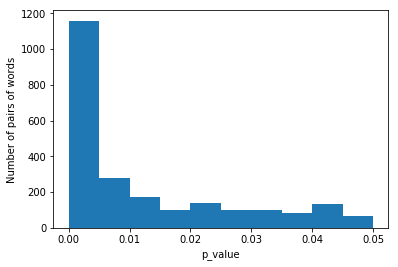

In [35]:
plt.hist(filter(lambda x: x<0.05,p_val_ks_ij_clusters_1_0))
plt.xlabel("p_value")
plt.ylabel("Number of pairs of words")

## 8. Plotting KS matrix

In [36]:
pylab.rcParams['figure.figsize'] = 20, 12

In [37]:
ks_matrix = np.reshape(ks_ij_clusters_1_0,(300,300))
print wcm.check_symmetric(ks_matrix)

False


In [38]:
df = pd.DataFrame(ks_matrix)
df.columns = set_300_most_frequent
df.index = set_300_most_frequent

In [39]:
is_1 = lambda x: 1 if x > 0 else 0
# count the number of documents in which the pair occurs
count_pair_c0 = map(lambda x: sum(map(is_1,x)),w_ij_cluster0)
count_pair_c1 = map(lambda x: sum(map(is_1,x)),w_ij_cluster1)

In [40]:
%%opts HeatMap [tools=['hover'] colorbar=True width=1000 height=1000 toolbar='above']
heatmap = hv.HeatMap(wcm.to_tuple(df,count_pair_c0,count_pair_c1),vdims=['KS','cluster_0','cluster_1'])
heatmap 

:HeatMap   [x,y]   (KS,cluster_0,cluster_1)

#### Ranking ks

In [41]:
list_ks_sorted = np.argsort(np.ravel(ks_matrix))
sorted_pair_ij = wcm.get_word_pairs(list_ks_sorted,len(ks_matrix),len(ks_matrix))
zipped_pair_ij = zip(sorted_pair_ij[0],sorted_pair_ij[1])
flipped = np.flip(sorted_pair_ij,0)

In [42]:
diagonal = ks_matrix.diagonal()
diagonal_sort = np.argsort(diagonal)
diagonal_sort = np.flip(diagonal_sort,0)
for d in range(len(diagonal_sort)):
    if d < 20:
        print str(d)+") "+set_300_most_frequent[diagonal_sort[d]]+", ks:"+str(diagonal[diagonal_sort[d]])

0) a, ks:0.967741935483871
1) y, ks:0.967741935483871
2) se, ks:0.96
3) que, ks:0.9354838709677419
4) el, ks:0.927741935483871
5) porque, ks:0.92
6) de, ks:0.9032258064516129
7) la, ks:0.8954838709677418
8) lo, ks:0.8954838709677418
9) no, ks:0.887741935483871
10) un, ks:0.8709677419354839
11) por, ks:0.84
12) si, ks:0.8309677419354838
13) eso, ks:0.8309677419354838
14) una, ks:0.8232258064516129
15) solamente, ks:0.8232258064516129
16) es, ks:0.8232258064516129
17) te, ks:0.8154838709677419
18) o, ks:0.8154838709677419
19) está, ks:0.8154838709677419


In [43]:
for i in range(len(flipped)):
    if i <20:
        print str(i)+") "+set_300_most_frequent[flipped[i][0]]+"->"+set_300_most_frequent[flipped[i][1]]+", ks: "+str(ks_matrix[flipped[i][0],flipped[i][1]])

0) que->y, ks: 0.887741935483871
1) la->se, ks: 0.88
2) y->la, ks: 0.8554838709677419
3) y->que, ks: 0.8554838709677419
4) a->en, ks: 0.847741935483871
5) que->se, ks: 0.847741935483871
6) que->una, ks: 0.847741935483871
7) a->de, ks: 0.847741935483871
8) de->el, ks: 0.8309677419354838
9) a->lo, ks: 0.8309677419354838
10) se->a, ks: 0.8309677419354838
11) que->el, ks: 0.8309677419354838
12) el->de, ks: 0.8309677419354838
13) el->que, ks: 0.8232258064516129
14) no->a, ks: 0.8154838709677419
15) de->la, ks: 0.8154838709677419
16) la->que, ks: 0.8154838709677419
17) que->lo, ks: 0.807741935483871
18) que->de, ks: 0.807741935483871
19) a->una, ks: 0.807741935483871


## 9. Plot Kmeans indicator vs SVM indicator

In [44]:
#TODO: other filters, other clusterization, and plot in 3d
pylab.rcParams['figure.figsize'] = 10, 6

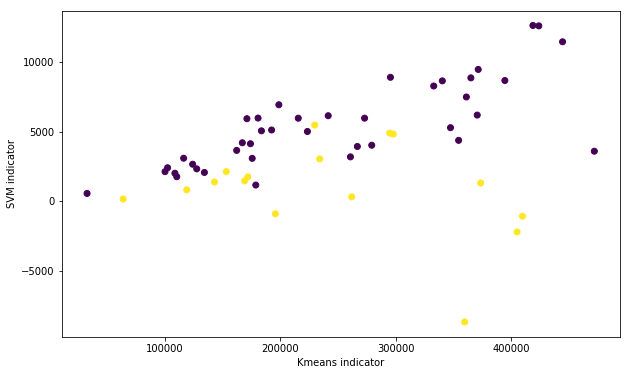

In [45]:
plt.scatter(kmeans_indicator_matrices,svm_indicator_matrices,c=labels_svm)
plt.ylabel("SVM indicator")
plt.xlabel("Kmeans indicator")
plt.show()

## 10. Plotting using other filters

#### Filter by positive emotions

In [46]:
from text_clustering.text_preprocessing import *

In [47]:
# filtrar documentos con palabras
matrices_list_positive,names_matrices = wcm.get_matrices(all_documents_dict,set_emocional_positiva)
if NORMALIZE_MATRIX_BY_LENGTH:
    norm_matrices_list = wcm.normalize_matrices(matrices_list_positive,document_length)
else:
    norm_matrices_list = matrices_list_positive
norm_array_list = map(lambda x: np.ravel(x),norm_matrices_list)
# sacar otros indicadores
centers_kmeans,labels_kmeans = wcm.get_kmeans_clusters(norm_array_list,2)
kmeans_axis = centers_kmeans[1] - centers_kmeans[0]
positive_indicator = map(lambda x: np.dot(x,kmeans_axis),norm_array_list) 

#### Filter by negative emotions

In [48]:
# filtrar documentos con palabras
matrices_list_negative,names_matrices = wcm.get_matrices(all_documents_dict,set_emocional_negativa)
if NORMALIZE_MATRIX_BY_LENGTH:
    norm_matrices_list = wcm.normalize_matrices(matrices_list_negative,document_length)
else:
    norm_matrices_list = matrices_list_negative
norm_array_list = map(lambda x: np.ravel(x),norm_matrices_list)
# sacar otros indicadores
centers_kmeans,labels_kmeans = wcm.get_kmeans_clusters(norm_array_list,2)
kmeans_axis = centers_kmeans[1] - centers_kmeans[0]
negative_indicator = map(lambda x: np.dot(x,kmeans_axis),norm_array_list) 

#### Filter by expresive words

In [49]:
# filtrar documentos con palabras
matrices_list_expresive,names_matrices = wcm.get_matrices(all_documents_dict,set_expresion)
if NORMALIZE_MATRIX_BY_LENGTH:
    norm_matrices_list = wcm.normalize_matrices(matrices_list_expresive,document_length)
else:
    norm_matrices_list = matrices_list_expresive
norm_array_list = map(lambda x: np.ravel(x),norm_matrices_list)
# sacar otros indicadores
centers_kmeans,labels_kmeans = wcm.get_kmeans_clusters(norm_array_list,2)
kmeans_axis = centers_kmeans[1] - centers_kmeans[0]
expresive_indicator = map(lambda x: np.dot(x,kmeans_axis),norm_array_list) 

#### Filter by experimental words

In [50]:
# filtrar documentos con palabras
matrices_list_experimental,names_matrices = wcm.get_matrices(all_documents_dict,set_experimentos)
if NORMALIZE_MATRIX_BY_LENGTH:
    norm_matrices_list = wcm.normalize_matrices(matrices_list_experimental,document_length)
else:
    norm_matrices_list = matrices_list_experimental
norm_array_list = map(lambda x: np.ravel(x),norm_matrices_list)
# sacar otros indicadores
centers_kmeans,labels_kmeans = wcm.get_kmeans_clusters(norm_array_list,2)
kmeans_axis = centers_kmeans[1] - centers_kmeans[0]
experimental_indicator = map(lambda x: np.dot(x,kmeans_axis),norm_array_list) 

#### Filter by electric words

In [51]:
# filtrar documentos con palabras
matrices_list_electrique,names_matrices = wcm.get_matrices(all_documents_dict,set_electricidad)
if NORMALIZE_MATRIX_BY_LENGTH:
    norm_matrices_list = wcm.normalize_matrices(matrices_list_electrique,document_length)
else:
    norm_matrices_list = matrices_list_electrique
norm_array_list = map(lambda x: np.ravel(x),norm_matrices_list)
# sacar otros indicadores
centers_kmeans,labels_kmeans = wcm.get_kmeans_clusters(norm_array_list,2)
kmeans_axis = centers_kmeans[1] - centers_kmeans[0]
electrique_indicator = map(lambda x: np.dot(x,kmeans_axis),norm_array_list) 

#### Filter by questions

In [52]:
# filtrar documentos con palabras
matrices_list_questions,names_matrices = wcm.get_matrices_phrases(all_documents_dict,set_preguntas)
if NORMALIZE_MATRIX_BY_LENGTH:
    norm_matrices_list = wcm.normalize_matrices(matrices_list_questions,document_length)
else:
    norm_matrices_list = matrices_list_questions
norm_array_list = map(lambda x: np.ravel(x),norm_matrices_list)
# sacar otros indicadores
centers_kmeans,labels_kmeans = wcm.get_kmeans_clusters(norm_array_list,2)
kmeans_axis = centers_kmeans[1] - centers_kmeans[0]
questions_indicator = map(lambda x: np.dot(x,kmeans_axis),norm_array_list) 

#### Filter by connective words

In [53]:
# filtrar documentos con palabras
matrices_list_conective,names_matrices = wcm.get_matrices_phrases(all_documents_dict,set_conectores)
if NORMALIZE_MATRIX_BY_LENGTH:
    norm_matrices_list = wcm.normalize_matrices(matrices_list_conective,document_length)
else:
    norm_matrices_list = matrices_list_conective
norm_array_list = map(lambda x: np.ravel(x),norm_matrices_list)
# sacar otros indicadores
centers_kmeans,labels_kmeans = wcm.get_kmeans_clusters(norm_array_list,2)
kmeans_axis = centers_kmeans[1] - centers_kmeans[0]
conective_indicator = map(lambda x: np.dot(x,kmeans_axis),norm_array_list) 

### Plot indicators by different filters

In [54]:
len(questions_indicator)

56

In [55]:
df = pd.DataFrame(data= {'cluster':labels_kmeans_all_words,'I_question': questions_indicator,'I_experimental': experimental_indicator,'I_expresive': expresive_indicator,'I_positive': positive_indicator,'I_negative': negative_indicator, 'I_electrique': electrique_indicator,'I_connective': conective_indicator,'I_kmeans': kmeans_indicator_matrices},)

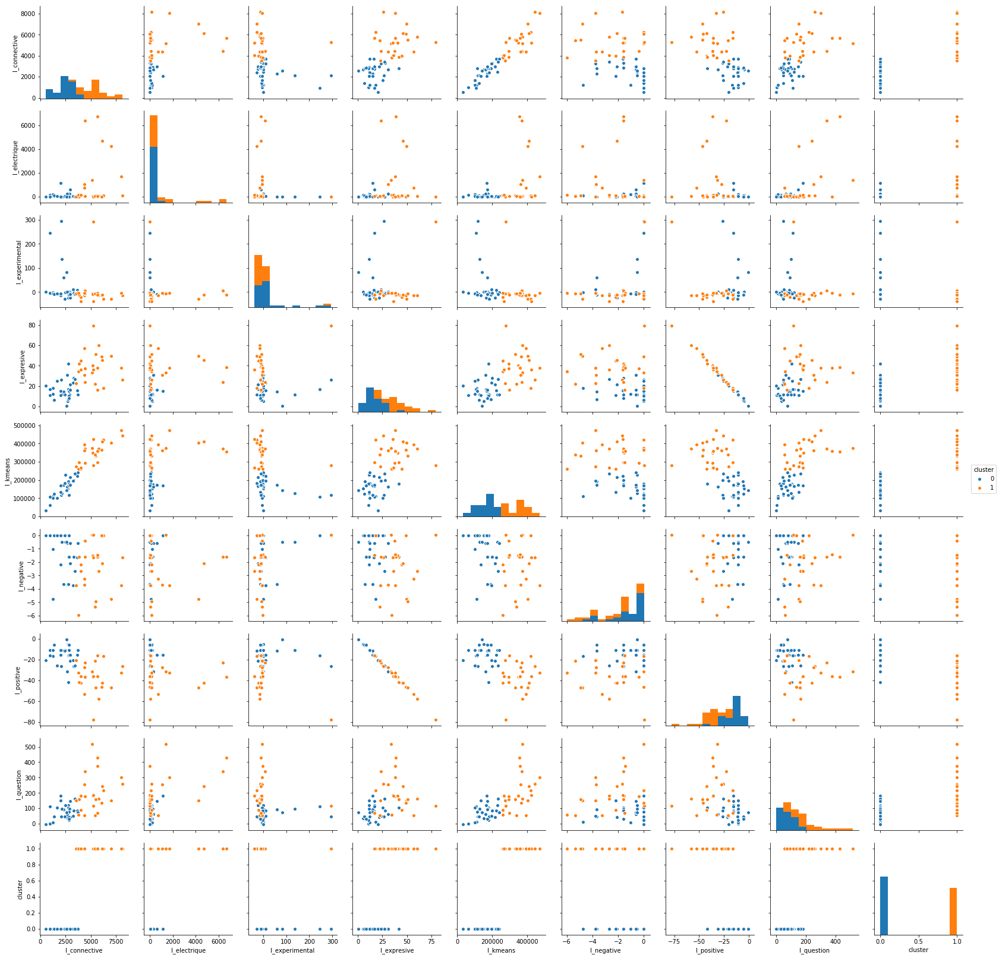

In [56]:
sns.pairplot(df, hue="cluster")

### Sacar matrix con todas palabras enzo

In [57]:
# filtrar documentos con palabras
# algunas palabras tienen dos palabras
matrices_filtered,names_matrices_filtered = wcm.get_matrices_phrases(all_documents_dict,set_all)
if NORMALIZE_MATRIX_BY_LENGTH:
    norm_matrices_list = wcm.normalize_matrices(matrices_filtered,document_length)
else:
    norm_matrices_list = matrices_filtered
norm_array_list = map(lambda x: np.ravel(x),norm_matrices_list)

In [58]:
centers_kmeans,labels_kmeans = wcm.get_kmeans_clusters(norm_array_list,2)
kmeans_axis = centers_kmeans[1] - centers_kmeans[0]
kmeans_indicator_matrices = map(lambda x: np.dot(x,kmeans_axis),norm_array_list) 
matrices_cluster1 = []
matrices_cluster0 = []
for i in range(len(labels_kmeans)):
    if labels_kmeans[i]:
        matrices_cluster1.append(norm_array_list[i])
    else:
        matrices_cluster0.append(norm_array_list[i])        
w_ij_cluster1 = np.transpose(matrices_cluster1)
w_ij_cluster0 = np.transpose(matrices_cluster0)
ks_ij_clusters_1_0 = []
p_val_ks_ij_clusters_1_0 = []
for i in range(len(w_ij_cluster0)):
    ks = stats.ks_2samp(w_ij_cluster0[i],w_ij_cluster1[i])
    ks_ij_clusters_1_0.append(ks[0])
    p_val_ks_ij_clusters_1_0.append(ks[1])

In [61]:
ks_matrix = np.reshape(ks_ij_clusters_1_0,(len(set_all),len(set_all)))
print wcm.check_symmetric(ks_matrix)
count_pair_c0 = map(lambda x: sum(map(is_1,x)),w_ij_cluster0)
count_pair_c1 = map(lambda x: sum(map(is_1,x)),w_ij_cluster1)

False


In [67]:
print max(count_pair_c0)
print max(count_pair_c1)

20
36


In [62]:
df = pd.DataFrame(ks_matrix)
df.columns = map(lambda x: x.replace(" ",""),set_all)
df.index =  map(lambda x: x.replace(" ",""),set_all)

In [63]:
%%opts HeatMap [tools=['hover'] colorbar=True width=1000 height=1000 toolbar='above']
heatmap = hv.HeatMap(wcm.to_tuple(df,count_pair_c0,count_pair_c1),vdims=['KS','cluster_0','cluster_1'])
heatmap 

:HeatMap   [x,y]   (KS,cluster_0,cluster_1)

#### Ranking KS

##### Ranking diagonal (over word frequency)

In [68]:
diagonal = ks_matrix.diagonal()
diagonal_sort = np.argsort(diagonal)
diagonal_sort = np.flip(diagonal_sort,0)
for d in range(len(diagonal_sort)):
    if d < 20:
        print str(d)+") "+set_all[diagonal_sort[d]]+", ks:"+str(diagonal[diagonal_sort[d]])

0) porque, ks:0.9444444444444444
1) entonces, ks:0.8111111111111111
2) pero, ks:0.7888888888888889
3) cómo, ks:0.6055555555555556
4) medi, ks:0.5944444444444444
5) bien, ks:0.5888888888888888
6) también, ks:0.5833333333333334
7) luego, ks:0.5777777777777777
8) ejemplo, ks:0.5666666666666667
9) más que, ks:0.5611111111111111
10) abajo, ks:0.5555555555555556
11) en cambio, ks:0.55
12) creo, ks:0.5111111111111112
13) vien, ks:0.5055555555555555
14) por ejemplo, ks:0.5055555555555555
15) incluso, ks:0.4888888888888888
16) es como, ks:0.4888888888888888
17) después, ks:0.4722222222222222
18) antes, ks:0.4722222222222222
19) mal, ks:0.4722222222222222


##### Ranking pair of words

In [69]:
list_ks_sorted = np.argsort(np.ravel(ks_matrix))
sorted_pair_ij = wcm.get_word_pairs(list_ks_sorted,len(ks_matrix),len(set_all))
zipped_pair_ij = zip(sorted_pair_ij[0],sorted_pair_ij[1])
flipped = np.flip(sorted_pair_ij,0)
for i in range(len(flipped)):
    if i <20:
        print str(i)+") "+set_all[flipped[i][0]]+"->"+set_all[flipped[i][1]]+", ks: "+str(ks_matrix[flipped[i][0],flipped[i][1]])

0) en cambio->cambio, ks: 0.55
1) ejemplo->porque, ks: 0.5166666666666666
2) por ejemplo->ejemplo, ks: 0.4666666666666666
3) porque->entonces, ks: 0.43333333333333335
4) por ejemplo->porque, ks: 0.42222222222222217
5) pero->ejemplo, ks: 0.38333333333333336
6) pero->porque, ks: 0.35555555555555557
7) porque->abajo, ks: 0.34444444444444444
8) porque->pero, ks: 0.33888888888888885
9) porque->mal, ks: 0.33333333333333337
10) mal->porque, ks: 0.3277777777777778
11) corriente->eléctrica, ks: 0.3222222222222222
12) entonces->porque, ks: 0.31666666666666665
13) pero->medi, ks: 0.31666666666666665
14) pero->por ejemplo, ks: 0.3111111111111111
15) derecha->izquierda, ks: 0.3055555555555556
16) eléctrico->porque, ks: 0.30000000000000004
17) porque->también, ks: 0.3
18) porque->medi, ks: 0.2722222222222222
19) porque->bien, ks: 0.25555555555555554
